In [66]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [67]:
import tensorflow as tf
from networks import VGG16
slim = tf.contrib.slim
import matplotlib.pyplot as plt
#from data_utils import load_imagenet_val
import numpy as np
from image_utils import preprocess_image, deprocess_image, VGG_MEAN

%matplotlib inline
plt.rcParams['figure.figsize'] = (15.0, 12.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

def get_session():
    """Create a session that dynamically allocates memory."""
    # See: https://www.tensorflow.org/tutorials/using_gpu#allowing_gpu_memory_growth
    config = tf.ConfigProto()
    config.gpu_options.allow_growth = True
    session = tf.Session(config=config)
    return session

In [68]:
tf.reset_default_graph()
#number of classes for ImageNet
NUM_CLASSES = 3
keep_prob = 0.5

#Define input data as X
X = tf.placeholder(dtype=tf.float32,shape=[None,256,256,4])
#Define target label as Y
Y = tf.placeholder(dtype=tf.int32,shape=[None,NUM_CLASSES])

#initialize vgg-16 model
#scores: the output of last layer
#end_points: include all layers outputs
scores = VGG16(X, keep_prob)

#the loss function
loss = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(labels=Y, logits=scores))

#get the variables (weights, biases) to restore
variables_to_restore = slim.get_variables_to_restore()

#define the saver
saver = tf.train.Saver(variables_to_restore)

In [69]:
#create the session
sess = get_session()
#restore the variables
weights_path = "C:\\Users\\Xiangyu Gao\\Documents\\GitHub\\Practical-Introduction-NN-hw\\Project\\VGG-16-60\\model"
saver.restore(sess, weights_path)

INFO:tensorflow:Restoring parameters from C:\Users\Xiangyu Gao\Documents\GitHub\Practical-Introduction-NN-hw\Project\VGG-16-60\model


In [70]:
from scipy.ndimage.filters import gaussian_filter1d
def blur_image(x, sigma=1):
    x = gaussian_filter1d(x, sigma, axis=1)
    x = gaussian_filter1d(x, sigma, axis=2)
    return x

In [71]:
def create_class_visualization(target_y, X,Y,scores, **kwargs):
    """
    Generate an image to maximize the score of target_y under a pretrained model.
    
    Inputs:
    - target_y: Integer in the range [0, 1000) giving the index of the class
    - X: image placeholder
    - Y: target label placeholder
    - scores: the score for your image
    
    Keyword arguments:(feel free to change any values that fit with you)
    - l2_reg: Strength of L2 regularization on the image
    - learning_rate: How big of a step to take
    - num_iterations: How many iterations to use
    - blur_every: How often to blur the image as an implicit regularizer
    - max_jitter: How much to gjitter the image as an implicit regularizer
    - show_every: How often to show the intermediate result
    """
    l2_reg = kwargs.pop('l2_reg', 1e-6)
    learning_rate = kwargs.pop('learning_rate', 10)
    num_iterations = kwargs.pop('num_iterations', 3000)
    blur_every = kwargs.pop('blur_every', 100)
    max_jitter = kwargs.pop('max_jitter', 16)
    show_every = kwargs.pop('show_every', 100)
    class_names = ['bike','car','pedestrian']
    # We use a single image of random noise as a starting point
    x = np.random.rand(256, 256, 4)
    x = preprocess_image(x)[None]
    
    ########################################################################
    # TODO: Compute the loss and the gradient of the loss with respect to  #
    # the input image, model.image. We compute these outside the loop so   #
    # that we don't have to recompute the gradient graph at each iteration #
    #                                                                      #
    # Note: loss and grad should be TensorFlow Tensors, not numpy arrays!  #
    #                                                                      #
    # The loss is the score for the target label, target_y. You should     #
    # use tf.gradients to compute                                          #
    # gradients. Don't forget the (subtracted) L2 regularization term!     #
    ########################################################################
    loss = tf.gather_nd(scores, tf.stack((tf.range(x.shape[0]), [target_y]), axis=1))
    #print(tf.shape(tf.stack((tf.range(x.shape[0]), [target_y]), axis=1)))
    loss -= l2_reg * (tf.norm(X) ** 2)
    grad = tf.gradients(loss, X)[0]
    
    ############################################################################
    #                             END OF YOUR CODE                             #
    ############################################################################

    
    for t in range(num_iterations):
        # Randomly jitter the image a bit; this gives slightly nicer results
        ox, oy = np.random.randint(-max_jitter, max_jitter+1, 2)
        x = np.roll(np.roll(x, ox, 1), oy, 2)
        
        ########################################################################
        # TODO: Use sess to compute the value of the gradient of the score for #
        # class target_y with respect to the pixels of the image, and make a   #
        # gradient step on the image using the learning rate. You should use   #
        # the grad variable you defined above.                                 #
        #                                                                      #
        # Be very careful about the signs of elements in your code.            #
        ########################################################################
        g = sess.run(grad, {X: x})
        x = x + learning_rate * g
        
        ############################################################################
        #                             END OF YOUR CODE                             #
        ############################################################################

        # Undo the jitter
        x = np.roll(np.roll(x, -ox, 1), -oy, 2)

        # As a regularizer, clip and periodically blur
        x = np.clip(x, 0.-VGG_MEAN, 1. - VGG_MEAN)
        
        if t % blur_every == 0:
            x = blur_image(x, sigma=0.5)

        #print(x.shape)
        # Periodically show the image
        if t == 0 or (t + 1) % show_every == 0 or t == num_iterations - 1:
            plt.imshow(np.abs(x[0,:,:,0]),cmap = 'viridis')
            class_name = class_names[target_y]
            plt.title('%s\nIteration %d / %d' % (class_name, t + 1, num_iterations))
            plt.gcf().set_size_inches(4, 4)
            plt.axis('off')
            plt.colorbar()
            plt.show()
    return x

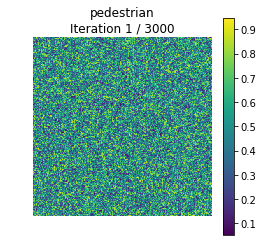

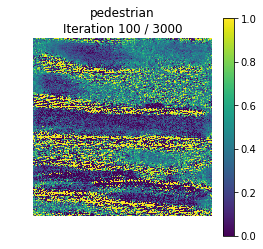

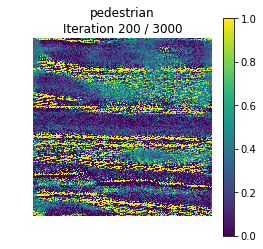

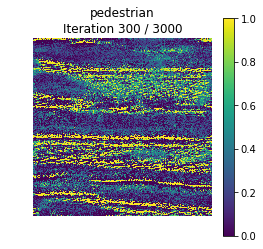

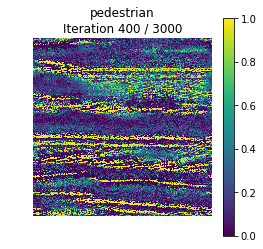

...

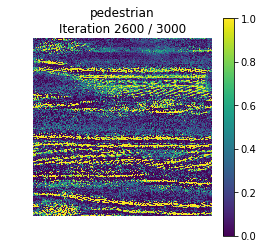

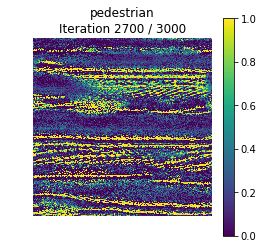

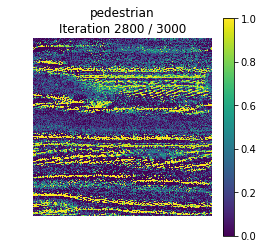

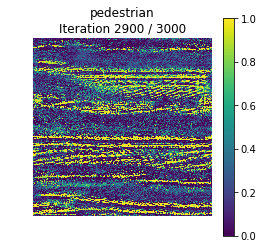

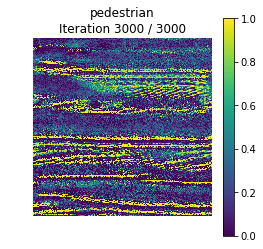

In [72]:
target_y = 2 # Tarantula
out = create_class_visualization(target_y, X,Y, scores)

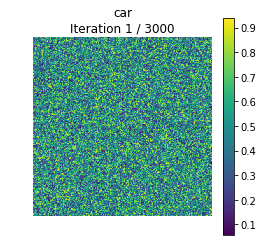

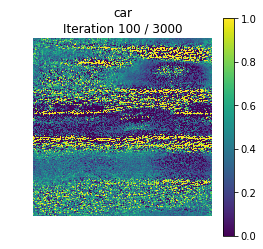

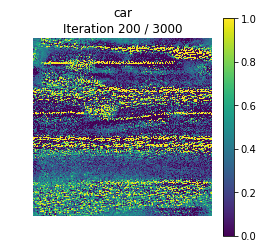

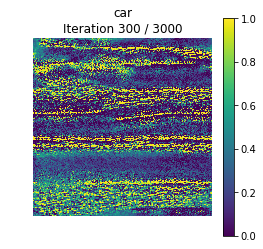

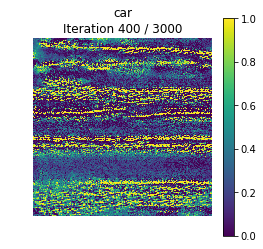

...

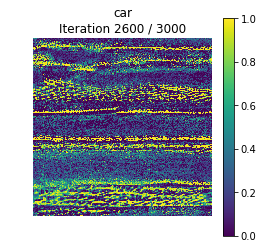

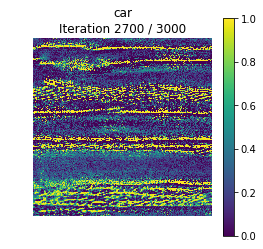

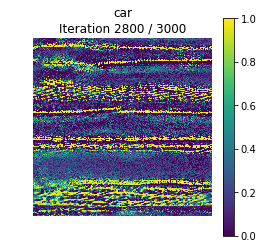

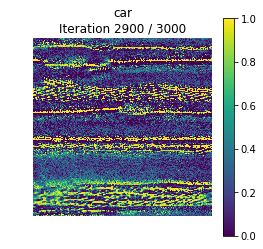

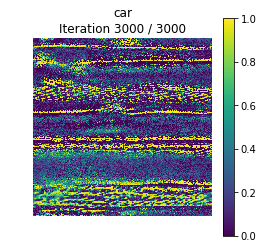

In [75]:
target_y = 1 # Tarantula
out = create_class_visualization(target_y, X,Y, scores)

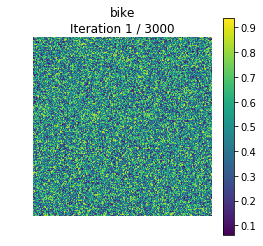

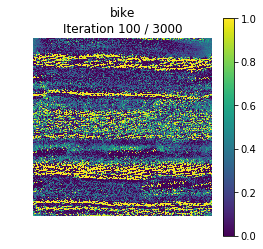

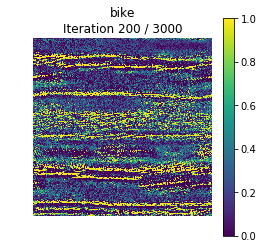

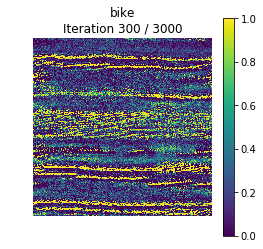

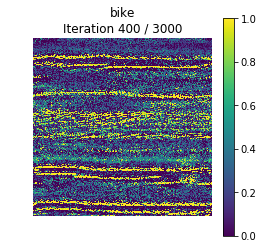

...

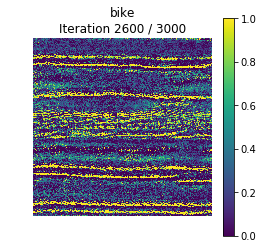

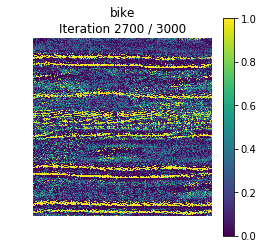

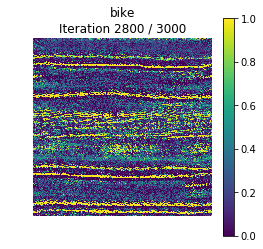

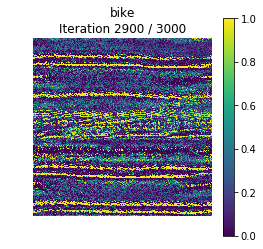

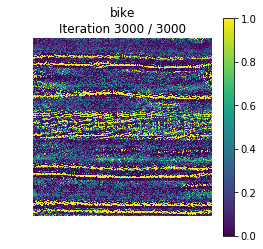

In [74]:
target_y = 0 # Tarantula
out = create_class_visualization(target_y, X,Y, scores)

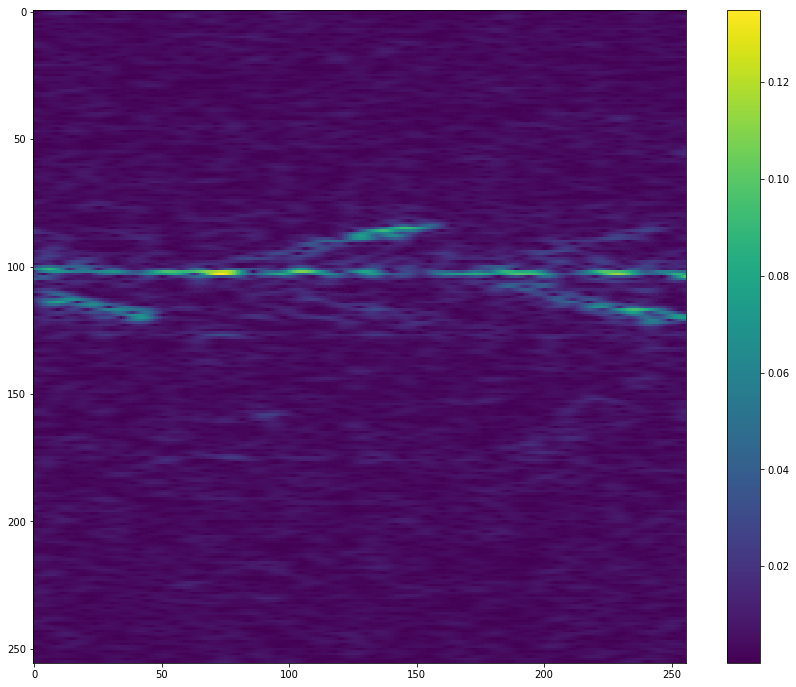

In [178]:
import scipy.io as spio
full_img_str = "D:/tmp/ee596prepro/2019_04_09_bms1000/data/000290"
#print(full_img_str)

mat = spio.loadmat(full_img_str, squeeze_me=True)
data = np.abs(mat["data_store"])
plt.imshow(data[:,:,0],cmap = 'viridis')
plt.colorbar()

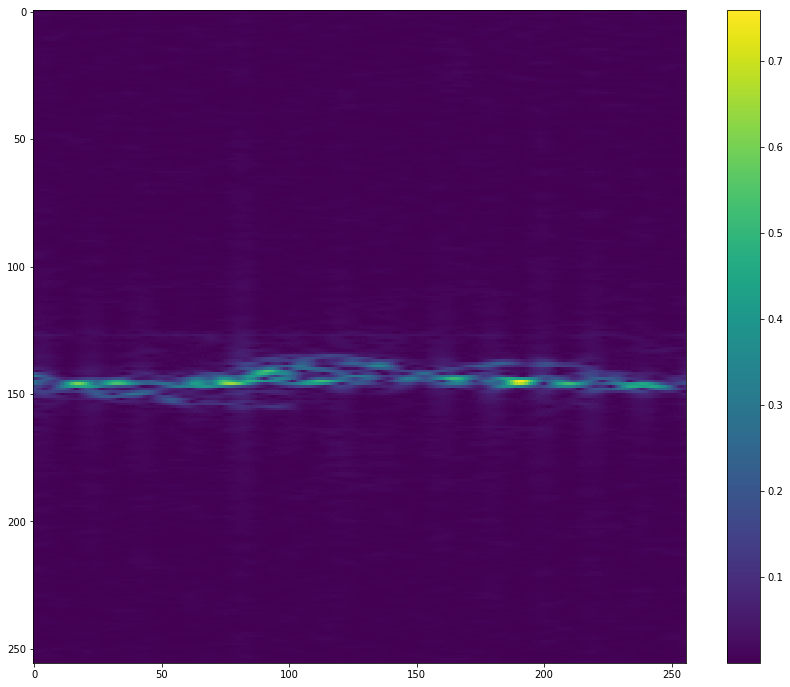

In [176]:
full_img_str = "D:/tmp/ee596prepro/2019_04_09_pms1000/data/000201"
#print(full_img_str)

mat = spio.loadmat(full_img_str, squeeze_me=True)
data = np.abs(mat["data_store"])
plt.imshow(data[:,:,0],cmap = 'viridis')
plt.colorbar()

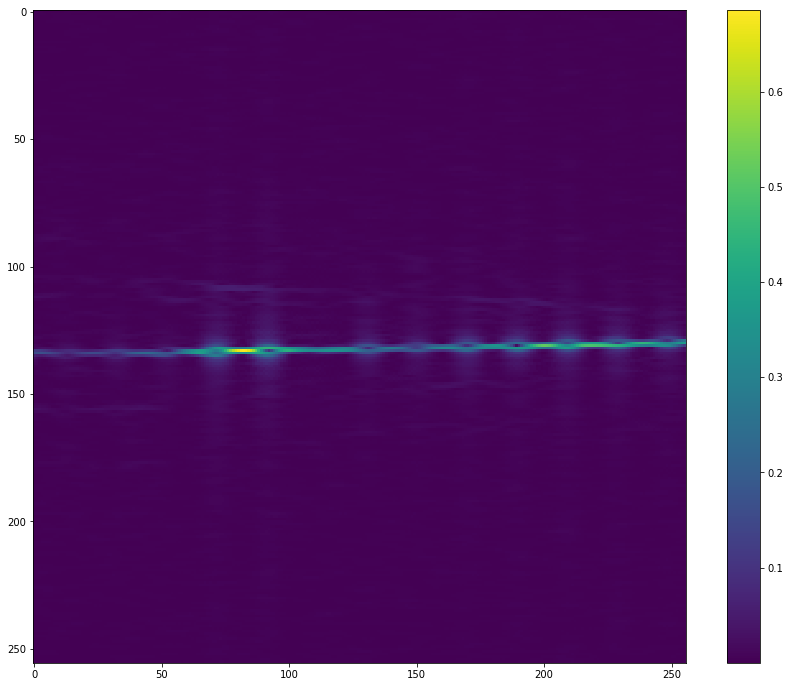

In [181]:
full_img_str = "D:/tmp/ee596prepro/2019_05_09_cs1m001/data/000160"
#print(full_img_str)

mat = spio.loadmat(full_img_str, squeeze_me=True)
data = np.abs(mat["data_store"])
plt.imshow(data[:,:,0],cmap = 'viridis')
plt.colorbar()